In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

color = sns.color_palette()

%matplotlib inline

from plotnine import ggplot, aes, geom_line

In [2]:
train_raw = pd.read_csv('train.csv')
train_raw.head()

,customer_id,customer_visit_score,customer_product_search_score,customer_ctr_score,customer_stay_score,customer_frequency_score,customer_product_variation_score,customer_order_score,customer_affinity_score,customer_active_segment,X1,customer_category
0,csid_1,13.168425,9.447662,-0.070203,-0.139541,0.436956,4.705761,2.537985,7.959503,C,F,0
1,csid_2,17.092979,7.329056,0.153298,-0.102726,0.380340,4.205138,4.193444,17.517381,C,A,0
2,csid_3,17.505334,5.143676,0.106709,0.262834,0.417648,4.479070,3.878971,12.595155,C,BA,0
3,csid_4,31.423381,4.917740,-0.020226,-0.100526,0.778130,5.055535,2.708940,4.795073,AA,F,0
4,csid_5,11.909502,4.237073,0.187178,0.172891,0.162067,3.445247,3.677360,56.636326,C,AA,0


In [3]:
test_raw = pd.read_csv('test.csv')
test_raw.head()

,customer_id,customer_visit_score,customer_product_search_score,customer_ctr_score,customer_stay_score,customer_frequency_score,customer_product_variation_score,customer_order_score,customer_affinity_score,customer_active_segment,X1
0,csid_10739,22.500174,3.702145,0.118811,0.093253,0.689237,5.786842,3.748009,7.661716,B,BA
1,csid_10740,13.225950,3.600102,0.130985,0.053575,0.142756,3.940359,3.469659,33.999679,B,AA
2,csid_10741,14.603376,5.084047,-0.004651,-0.036299,0.333709,4.254662,3.855939,33.485630,B,AA
3,csid_10742,26.149905,3.025501,0.229740,0.204591,3.768405,6.942625,2.362421,0.795372,B,BA
4,csid_10743,19.810630,5.020400,-0.011347,-0.028780,0.286841,4.585513,3.278624,15.052058,C,BA


In [4]:
numrical = [
            'customer_visit_score', 'customer_product_search_score', 
            'customer_ctr_score', 'customer_stay_score', 
            'customer_frequency_score', 'customer_product_variation_score', 
            'customer_order_score', 'customer_affinity_score'
]

categorical = [
               'customer_active_segment','X1'
]
train_raw.shape

(10738, 12)

In [5]:
train_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10738 entries, 0 to 10737
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_id                       10738 non-null  object 
 1   customer_visit_score              10738 non-null  float64
 2   customer_product_search_score     10696 non-null  float64
 3   customer_ctr_score                10738 non-null  float64
 4   customer_stay_score               10701 non-null  float64
 5   customer_frequency_score          10738 non-null  float64
 6   customer_product_variation_score  10692 non-null  float64
 7   customer_order_score              10672 non-null  float64
 8   customer_affinity_score           10738 non-null  float64
 9   customer_active_segment           10715 non-null  object 
 10  X1                                10701 non-null  object 
 11  customer_category                 10738 non-null  int64  
dtypes: f

In [6]:
train_raw.describe()

,customer_visit_score,customer_product_search_score,customer_ctr_score,customer_stay_score,customer_frequency_score,customer_product_variation_score,customer_order_score,customer_affinity_score,customer_category
count,10738.000000,10696.000000,10738.000000,10701.000000,10738.000000,10692.000000,10672.000000,10738.000000,10738.000000
mean,19.060941,5.274847,0.175912,0.374230,2.376895,5.788180,3.150071,17.061836,0.120600
std,7.419609,1.882559,0.372829,1.222031,5.601911,2.531309,1.035416,18.762693,0.325677
min,0.568965,-0.161940,-0.547989,-0.462494,0.028575,2.752836,0.363338,-0.486834,0.000000
25%,13.518021,3.971587,0.010840,-0.027666,0.313610,4.193234,2.454017,4.530085,0.000000
50%,18.774109,5.218479,0.074078,0.037201,0.516830,4.842575,3.118394,12.653357,0.000000
75%,24.501719,6.520364,0.159606,0.179029,1.125380,6.286400,3.756566,23.114577,0.000000
max,47.306691,16.638243,2.679474,14.701914,52.395014,18.743836,9.090206,248.552755,1.000000


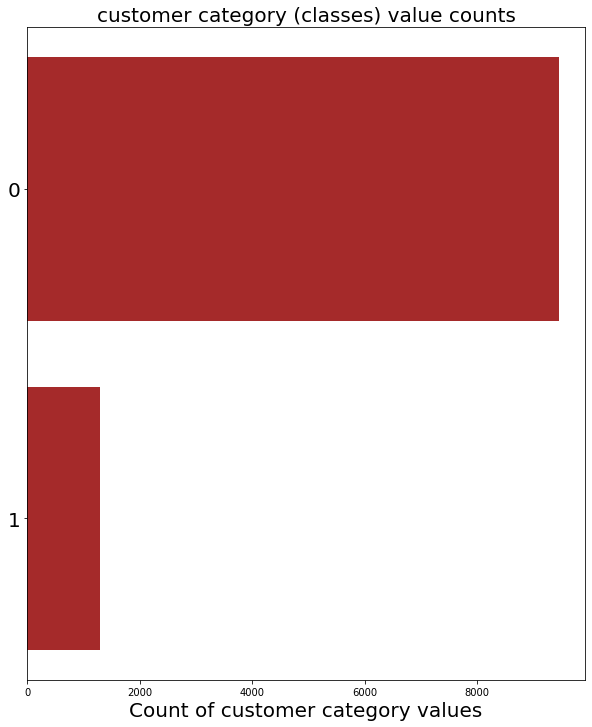

In [7]:
cust_cat = train_raw['customer_category'].value_counts().reset_index()
cust_cat = cust_cat.sort_values(by='customer_category')

ind = np.arange(cust_cat.shape[0])
width = 0.9
fig, ax = plt.subplots(figsize=(10,12))
rects = ax.barh(ind, cust_cat.customer_category.values, color='brown')
ax.set_yticks(ind)
ax.set_yticklabels(cust_cat.index.values, rotation='horizontal', fontsize=20)
ax.set_xlabel("Count of customer category values", fontsize=20)
ax.set_title("customer category (classes) value counts", fontsize=20)
plt.show()

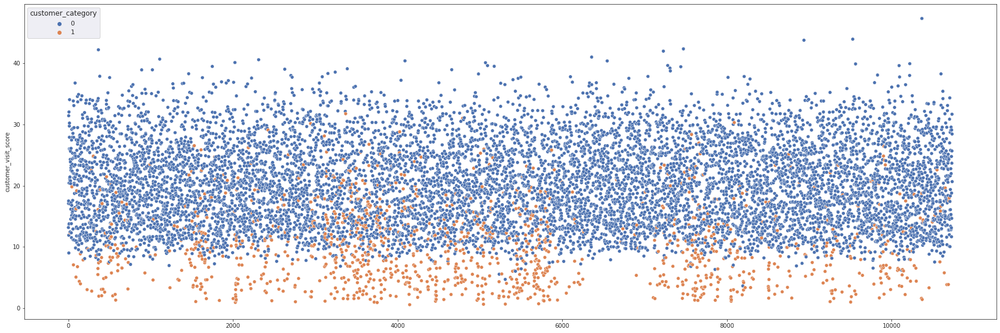

In [8]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_visit_score"], hue=train_raw['customer_category'])

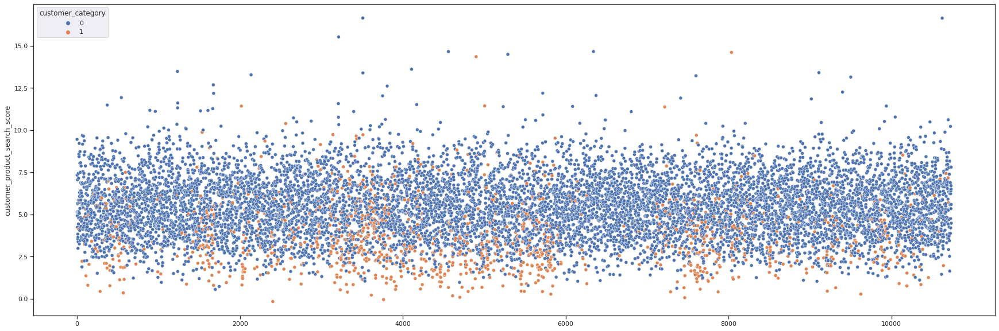

In [9]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_product_search_score"], hue=train_raw['customer_category'])

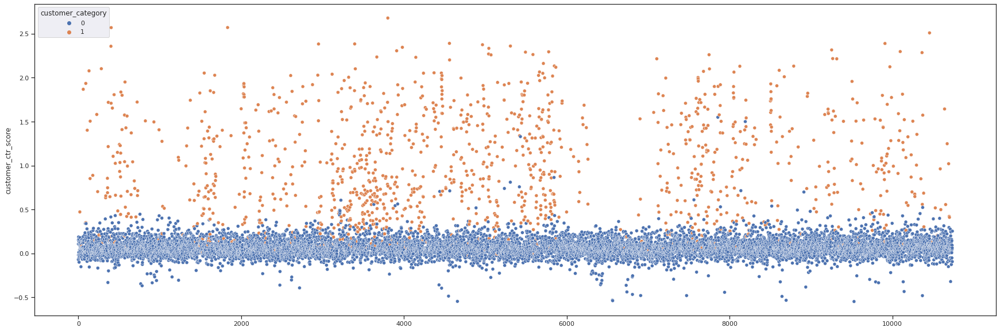

In [10]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_ctr_score"], hue=train_raw['customer_category'])

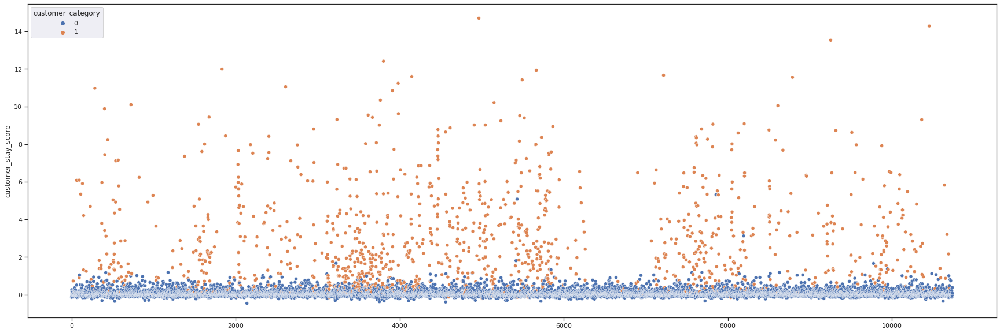

In [11]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_stay_score"], hue=train_raw['customer_category'])

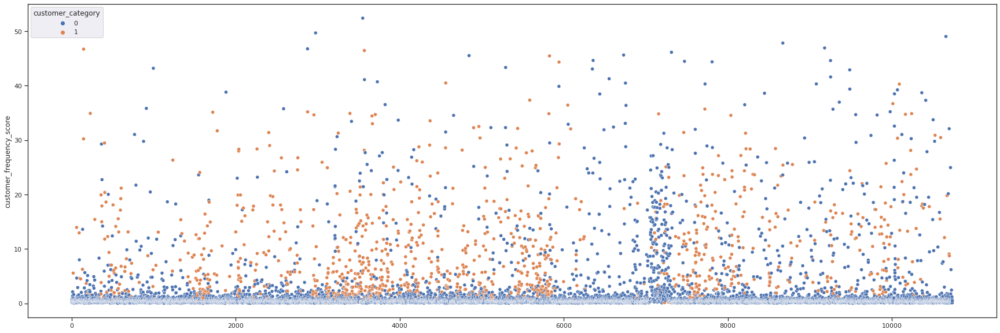

In [12]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_frequency_score"], hue=train_raw['customer_category'])

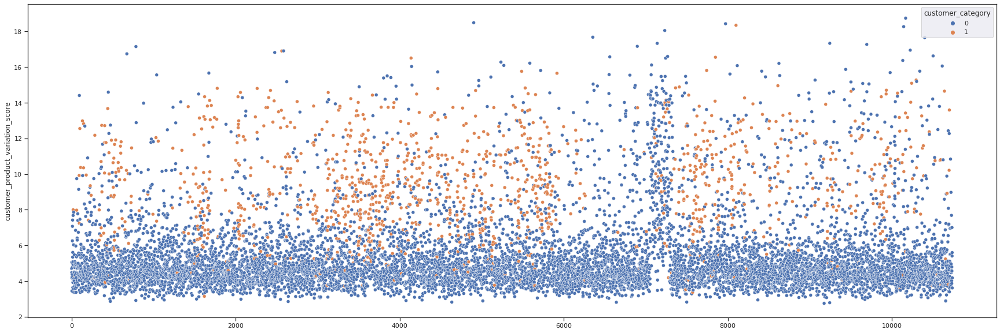

In [13]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_product_variation_score"], hue=train_raw['customer_category'])

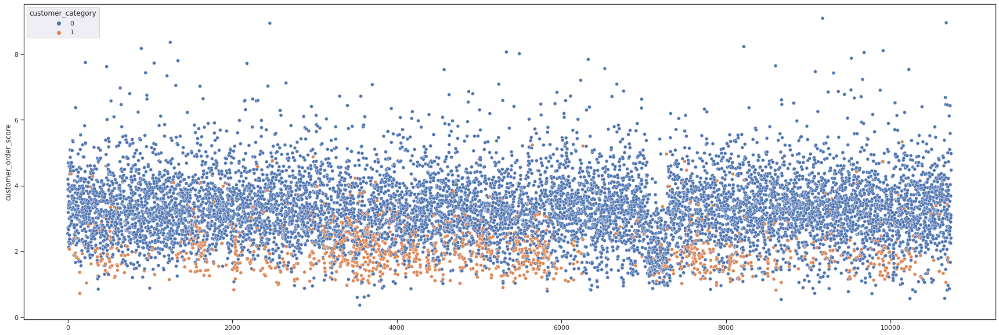

In [14]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_order_score"], hue=train_raw['customer_category'])

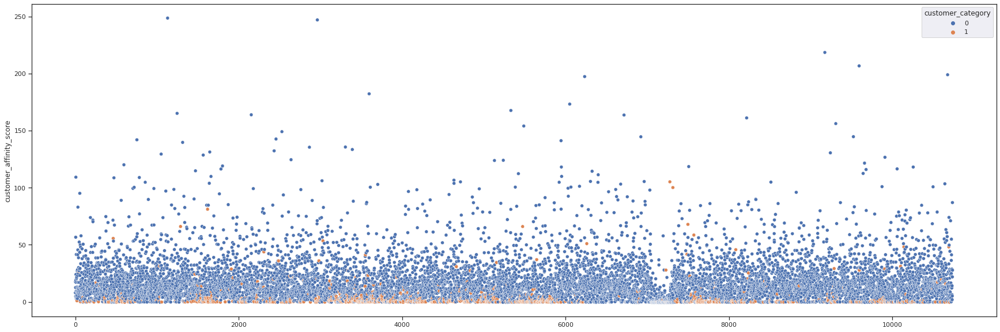

In [15]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_affinity_score"], hue=train_raw['customer_category'])

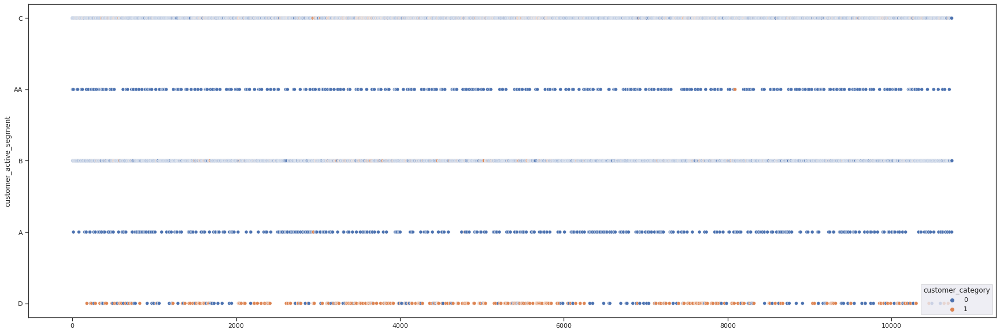

In [16]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["customer_active_segment"], hue=train_raw['customer_category'])

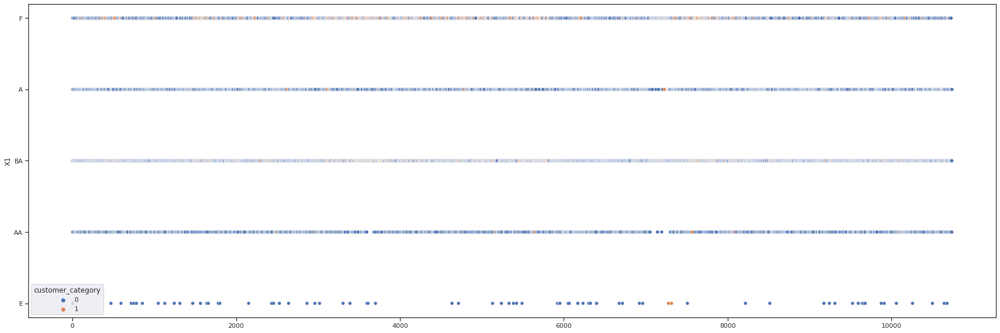

In [17]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(x=train_raw.index, y=train_raw["X1"], hue=train_raw['customer_category'])

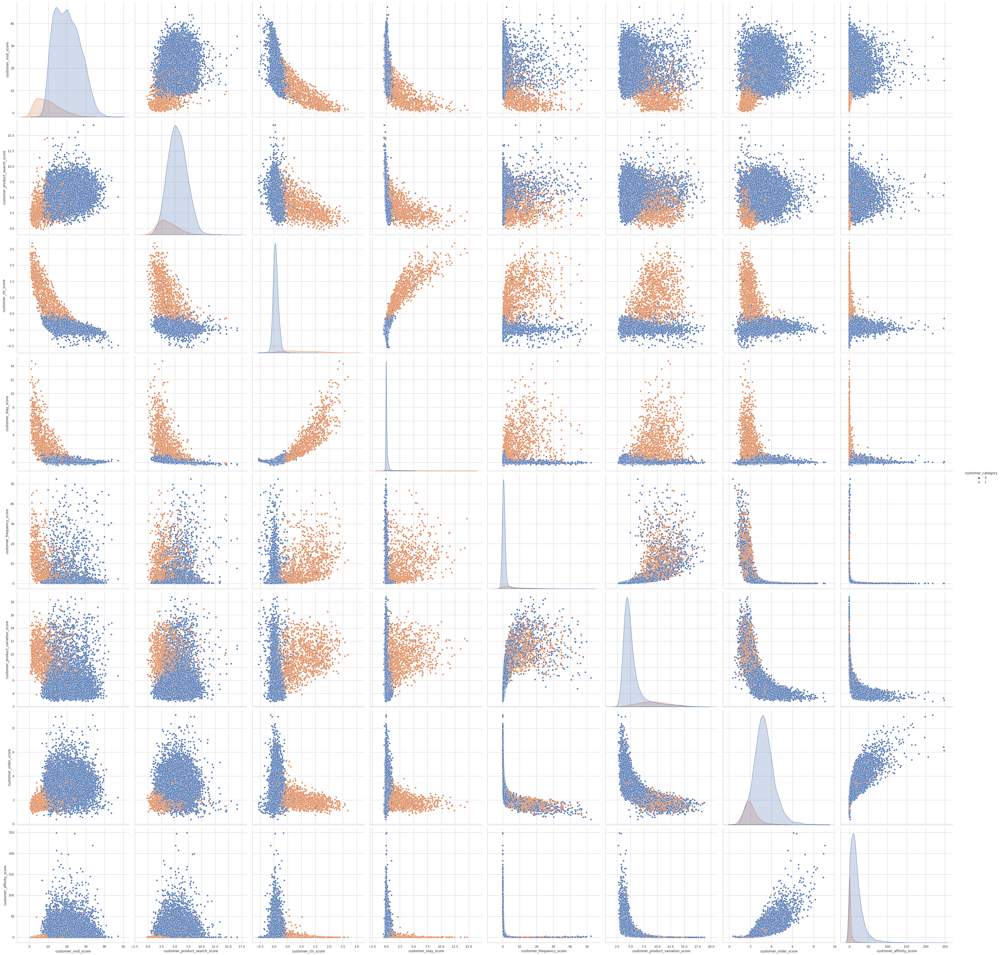

In [18]:
#bivariate analysis by plotting pair plot
#pair-plot
plt.close();
sns.set_style("whitegrid");
sns.pairplot(train_raw, hue="customer_category", height=6);
plt.show()

In [19]:
train_raw1 = train_raw.drop(['customer_affinity_score'], axis=1)

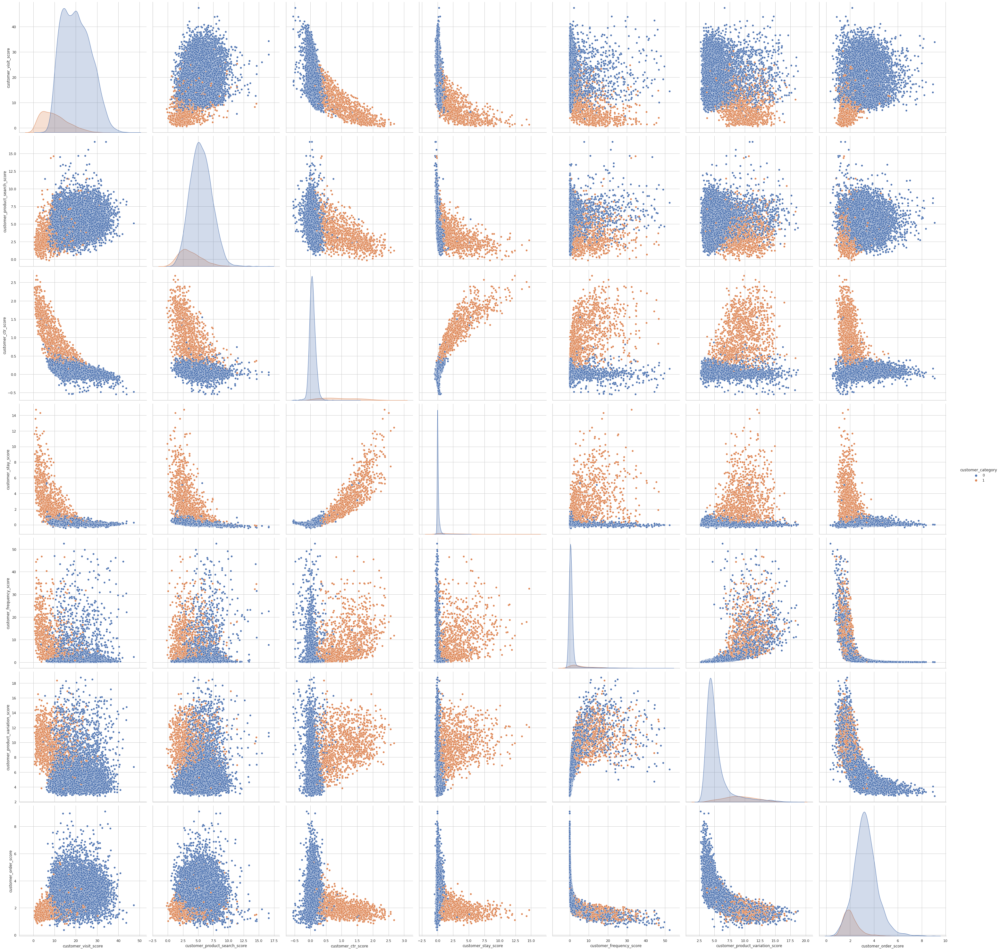

In [20]:
#bivariate analysis by plotting pair plot
#pair-plot
plt.close();
sns.set_style("whitegrid");
sns.pairplot(train_raw1, hue="customer_category", height=6);
plt.show()

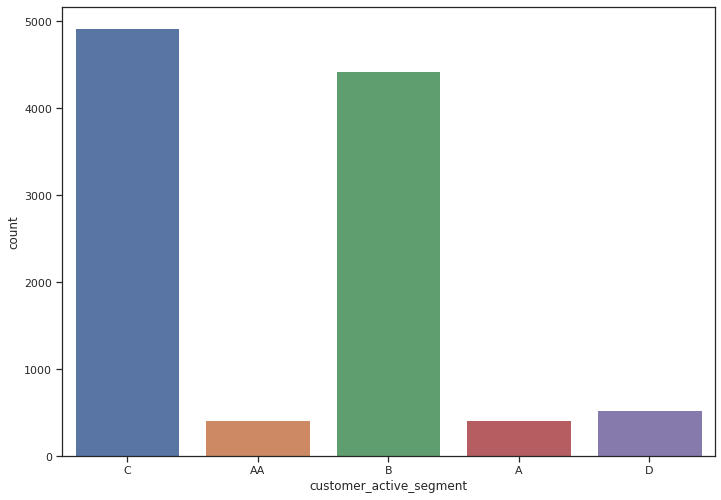

In [21]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.set_theme(style="darkgrid")
sns.countplot(x="customer_active_segment", data=train_raw1)

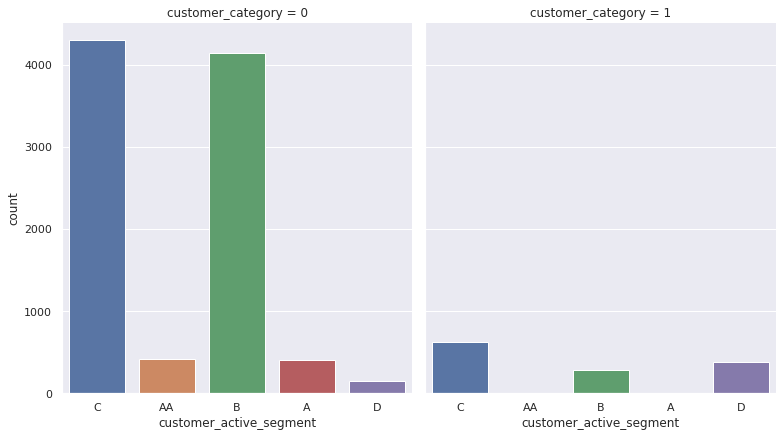

In [22]:
sns.catplot(x="customer_active_segment", col="customer_category",
                data=train_raw, kind="count",
                height=6, aspect=.9)

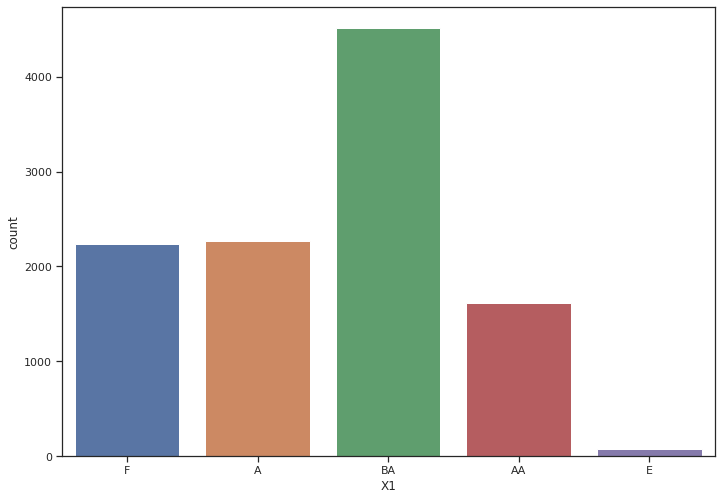

In [23]:
# plot
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.set_theme(style="darkgrid")
sns.countplot(x="X1", data=train_raw1)

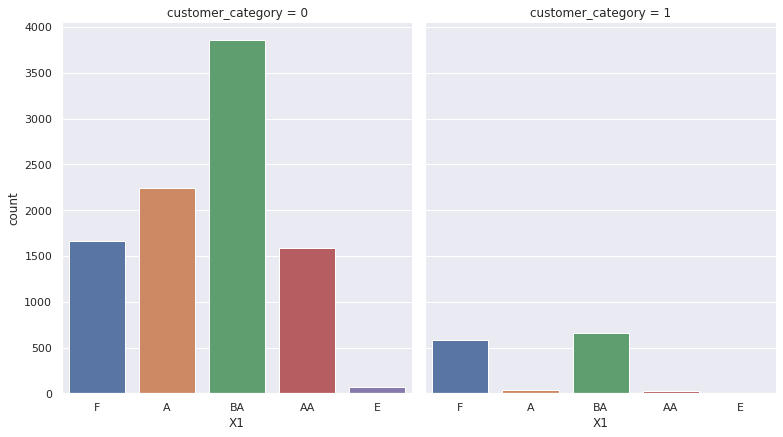

In [24]:
sns.catplot(x="X1", col="customer_category",
                data=train_raw1, kind="count",
                height=6, aspect=.9)

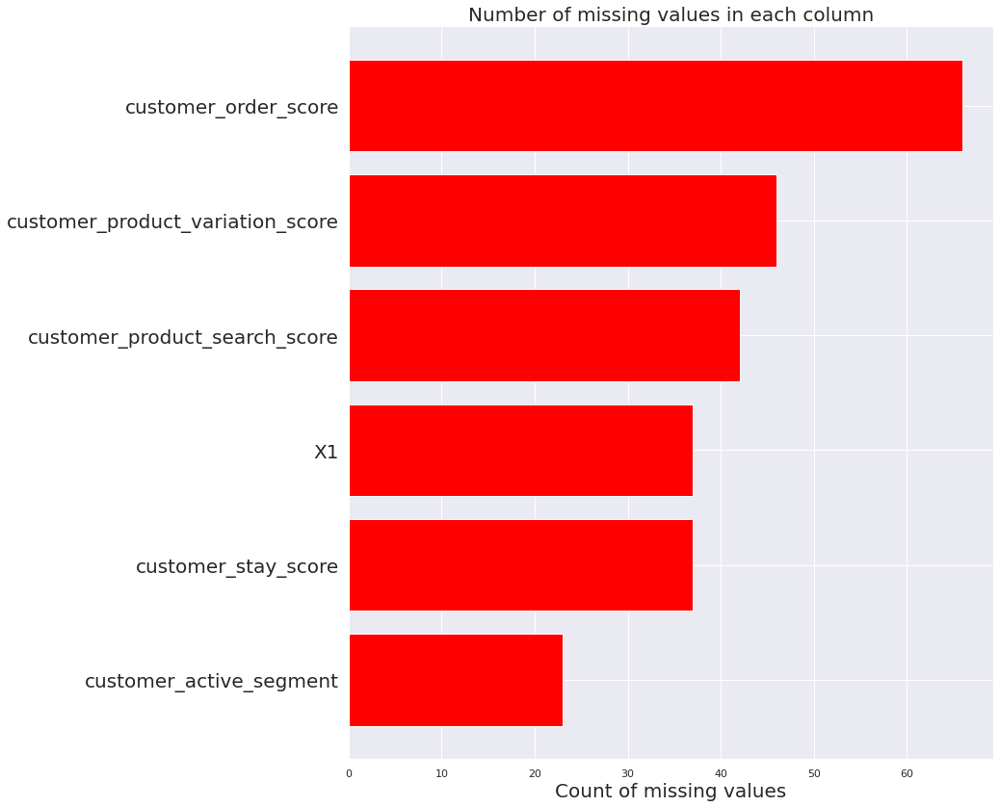

In [25]:
train_nan = train_raw1.isnull().sum(axis=0).reset_index()
train_nan.columns = ['column_name', 'missing_count']
train_nan = train_nan.loc[train_nan['missing_count']>0]
train_nan = train_nan.sort_values(by='missing_count')

ind = np.arange(train_nan.shape[0])
width = 0.9
fig, ax = plt.subplots(figsize=(12,14))
rects = ax.barh(ind, train_nan.missing_count.values, color='red')
ax.set_yticks(ind)
ax.set_yticklabels(train_nan.column_name.values, rotation='horizontal', fontsize=20)
ax.set_xlabel("Count of missing values", fontsize=20)
ax.set_title("Number of missing values in each column", fontsize=20)
plt.show()

In [26]:
train_raw1['customer_order_score'].fillna((train_raw1['customer_order_score'].mean()), inplace=True)
train_raw1['customer_product_variation_score'].fillna((train_raw1['customer_product_variation_score'].mean()), inplace=True)
train_raw1['customer_product_search_score'].fillna((train_raw1['customer_product_search_score'].mean()), inplace=True)
train_raw1['customer_stay_score'].fillna((train_raw1['customer_stay_score'].mean()), inplace=True)

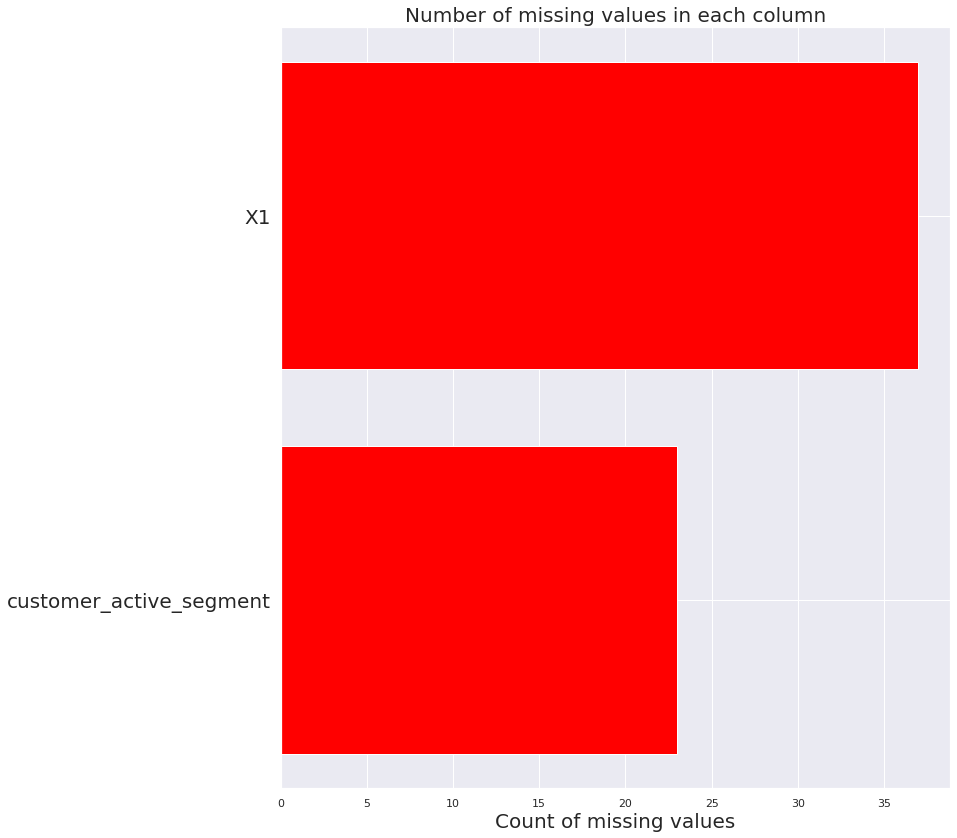

In [27]:
train_nan = train_raw1.isnull().sum(axis=0).reset_index()
train_nan.columns = ['column_name', 'missing_count']
train_nan = train_nan.loc[train_nan['missing_count']>0]
train_nan = train_nan.sort_values(by='missing_count')

ind = np.arange(train_nan.shape[0])
width = 0.9
fig, ax = plt.subplots(figsize=(12,14))
rects = ax.barh(ind, train_nan.missing_count.values, color='red')
ax.set_yticks(ind)
ax.set_yticklabels(train_nan.column_name.values, rotation='horizontal', fontsize=20)
ax.set_xlabel("Count of missing values", fontsize=20)
ax.set_title("Number of missing values in each column", fontsize=20)
plt.show()

In [28]:
train_raw1 = train_raw1.apply(lambda x:x.fillna(x.value_counts().index[0]))
train_raw1.isnull().sum()

customer_id                         0
customer_visit_score                0
customer_product_search_score       0
customer_ctr_score                  0
customer_stay_score                 0
customer_frequency_score            0
customer_product_variation_score    0
customer_order_score                0
customer_active_segment             0
X1                                  0
customer_category                   0
dtype: int64

In [29]:
X_raw = train_raw1[[
            'customer_visit_score', 'customer_product_search_score', 
            'customer_ctr_score', 'customer_stay_score', 
            'customer_frequency_score', 'customer_product_variation_score', 
            'customer_order_score','customer_active_segment','X1'
]]
y_raw = train_raw1[['customer_category']]

In [30]:
X_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10738 entries, 0 to 10737
Data columns (total 9 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   customer_visit_score              10738 non-null  float64
 1   customer_product_search_score     10738 non-null  float64
 2   customer_ctr_score                10738 non-null  float64
 3   customer_stay_score               10738 non-null  float64
 4   customer_frequency_score          10738 non-null  float64
 5   customer_product_variation_score  10738 non-null  float64
 6   customer_order_score              10738 non-null  float64
 7   customer_active_segment           10738 non-null  object 
 8   X1                                10738 non-null  object 
dtypes: float64(7), object(2)
memory usage: 755.1+ KB


In [31]:
#converting categorical feature into one hot.
X = pd.get_dummies(X_raw)
X

,customer_visit_score,customer_product_search_score,customer_ctr_score,customer_stay_score,customer_frequency_score,customer_product_variation_score,customer_order_score,customer_active_segment_A,customer_active_segment_AA,customer_active_segment_B,customer_active_segment_C,customer_active_segment_D,X1_A,X1_AA,X1_BA,X1_E,X1_F
0,13.168425,9.447662,-0.070203,-0.139541,0.436956,4.705761,2.537985,0,0,0,1,0,0,0,0,0,1
1,17.092979,7.329056,0.153298,-0.102726,0.380340,4.205138,4.193444,0,0,0,1,0,1,0,0,0,0
2,17.505334,5.143676,0.106709,0.262834,0.417648,4.479070,3.878971,0,0,0,1,0,0,0,1,0,0
3,31.423381,4.917740,-0.020226,-0.100526,0.778130,5.055535,2.708940,0,1,0,0,0,0,0,0,0,1
4,11.909502,4.237073,0.187178,0.172891,0.162067,3.445247,3.677360,0,0,0,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10733,23.672615,6.701514,0.092879,-0.017332,1.210397,7.003663,3.027084,0,0,0,1,0,0,0,1,0,0
10734,25.673028,6.497796,0.050216,-0.047211,0.725230,5.407507,3.104172,0,0,0,1,0,0,0,1,0,0
10735,31.676844,7.799880,0.062961,-0.032765,0.318118,5.598486,2.403051,1,0,0,0,0,0,0,1,0,0
10736,28.441780,5.588302,-0.093931,0.081586,0.132177,3.616492,4.972243,0,0,1,0,0,0,1,0,0,0


In [32]:
#standardize the X
from sklearn.preprocessing import StandardScaler
std = StandardScaler()

X = std.fit_transform(X)

In [33]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_raw, test_size=0.33, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(7194, 17)
(3544, 17)
(7194, 1)
(3544, 1)


In [34]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
import warnings
warnings.filterwarnings('ignore')

In [35]:
#Hyperparameter tuning
estimator = XGBClassifier(
    objective= 'binary:logistic',
    nthread=4,
    seed=42
)

In [36]:
parameters = {
    'max_depth': [len(y_train)],
    'n_estimators': range(50, 500, 50),
    'learning_rate': [0.1, 0.01,0.3, 0.05],

}

In [46]:
grid_search = GridSearchCV(
    estimator=estimator,
    param_grid=parameters,
    scoring = 'precision',
    n_jobs = 10,
    cv = 10,
    verbose=True
)

In [47]:
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 36 candidates, totalling 360 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   57.2s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed: 10.1min
[Parallel(n_jobs=10)]: Done 360 out of 360 | elapsed: 18.7min finished


GridSearchCV(cv=10, error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=4, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=42, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=10,
             param_grid={'learning_rate': [0.1, 0.01, 0.3, 0.05],
                         'max_depth': [7194],
                         'n_estimators': range(50, 500, 50)},
         

In [48]:
grid_search.best_estimator_

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.05, max_delta_step=0, max_depth=7194,
              min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
              nthread=4, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=None, subsample=1, verbosity=1)

In [49]:
xgb_gscv = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=None, n_estimators=60, n_jobs=1,
              nthread=4, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=42,
              silent=None, subsample=1, verbosity=1)

xgb_gscv.fit(X_train, y_train)
print(xgb_gscv.score(X_train, y_train))
print(xgb_gscv.score(X_test, y_test))

0.9801223241590215
0.975451467268623


In [51]:
y_test_pred = xgb_gscv.predict(X_test)

[[3106   23]
 [  64  351]]


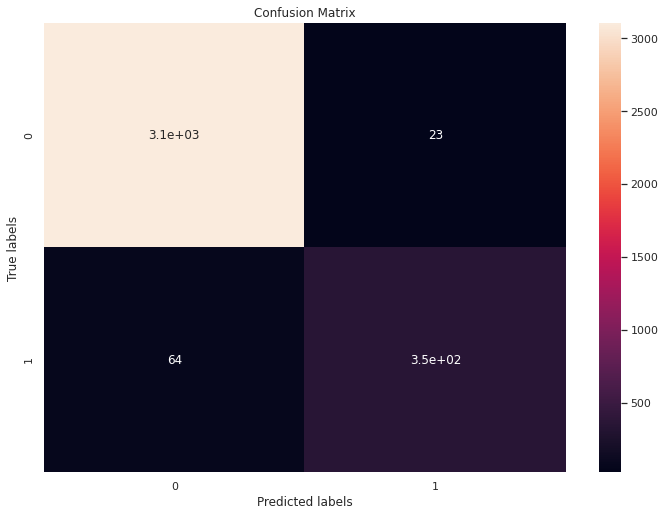

In [61]:
# Compute confusion matrix
from sklearn.metrics import confusion_matrix
labels = ['0', '1']
cm = confusion_matrix(y_test, y_test_pred)
print(cm)
fig, ax = plt.subplots()
fig.set_size_inches(11.7, 8.27)
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['0', '1']); ax.yaxis.set_ticklabels(['0', '1']);

In [62]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
print(f1_score(y_test, y_test_pred))
print(precision_score(y_test, y_test_pred))
print(recall_score(y_test, y_test_pred))    

0.8897338403041825
0.9385026737967914
0.8457831325301205
